In [1]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from sklearn import linear_model, datasets, tree
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC 
from sklearn.datasets import make_blobs
from sklearn.model_selection import GridSearchCV
import seaborn as sns
from pandas.plotting import scatter_matrix
from matplotlib import pyplot

In [3]:
df = pd.read_csv("Speed Dating Data.csv", encoding="ISO-8859-1")

df.dtypes

iid           int64
id          float64
gender        int64
idg           int64
condtn        int64
             ...   
attr5_3     float64
sinc5_3     float64
intel5_3    float64
fun5_3      float64
amb5_3      float64
Length: 195, dtype: object

In [4]:
pd.options.display.max_rows = 4000

In [5]:
df .isnull().sum()


iid            0
id             1
gender         0
idg            0
condtn         0
wave           0
round          0
position       0
positin1    1846
order          0
partner        0
pid           10
match          0
int_corr     158
samerace       0
age_o        104
race_o        73
pf_o_att      89
pf_o_sin      89
pf_o_int      89
pf_o_fun      98
pf_o_amb     107
pf_o_sha     129
dec_o          0
attr_o       212
sinc_o       287
intel_o      306
fun_o        360
amb_o        722
shar_o      1076
like_o       250
prob_o       318
met_o        385
age           95
field         63
field_cd      82
undergra    3464
mn_sat      5245
tuition     4795
race          63
imprace       79
imprelig      79
from          79
zipcode     1064
income      4099
goal          79
date          97
go_out        79
career        89
career_c     138
sports        79
tvsports      79
exercise      79
dining        79
museums       79
art           79
hiking        79
gaming        79
clubbing      

### Select dataset with NaN < 400 

In [71]:
# Drop columns having NaN > 400
dff =df.copy()
s = dff.isnull().sum(axis = 0)

for col in dff:
    if s[col] >400:
        del dff[col]
        
del dff['id']
del dff['iid']
del dff['career']
del dff['from']
del dff['idg']
del dff['pid']
del dff['field']

dff.columns


Index(['gender', 'condtn', 'wave', 'round', 'position', 'order', 'partner',
       'match', 'int_corr', 'samerace', 'age_o', 'race_o', 'pf_o_att',
       'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha', 'dec_o',
       'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'like_o', 'prob_o', 'met_o',
       'age', 'field_cd', 'race', 'imprace', 'imprelig', 'goal', 'date',
       'go_out', 'career_c', 'sports', 'tvsports', 'exercise', 'dining',
       'museums', 'art', 'hiking', 'gaming', 'clubbing', 'reading', 'tv',
       'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga',
       'exphappy', 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1',
       'shar1_1', 'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1',
       'shar2_1', 'attr3_1', 'sinc3_1', 'fun3_1', 'intel3_1', 'amb3_1', 'dec',
       'attr', 'sinc', 'intel', 'fun', 'like', 'prob', 'met'],
      dtype='object')

In [60]:
dff.dtypes

gender        int64
condtn        int64
wave          int64
round         int64
position      int64
order         int64
partner       int64
match         int64
int_corr    float64
samerace      int64
age_o       float64
race_o      float64
pf_o_att    float64
pf_o_sin    float64
pf_o_int    float64
pf_o_fun    float64
pf_o_amb    float64
pf_o_sha    float64
dec_o         int64
attr_o      float64
sinc_o      float64
intel_o     float64
fun_o       float64
like_o      float64
prob_o      float64
met_o       float64
age         float64
field_cd    float64
race        float64
imprace     float64
imprelig    float64
goal        float64
date        float64
go_out      float64
career_c    float64
sports      float64
tvsports    float64
exercise    float64
dining      float64
museums     float64
art         float64
hiking      float64
gaming      float64
clubbing    float64
reading     float64
tv          float64
theater     float64
movies      float64
concerts    float64
music       float64


In [61]:


numeric_col = dff.columns

# Correlation Matrix formation
corr_matrix = dff.loc[:,numeric_col].corr()
print(corr_matrix)

            gender    condtn      wave     round  position     order  \
gender    1.000000 -0.002627 -0.001264  0.020630 -0.001091  0.006685   
condtn   -0.002627  1.000000  0.219627  0.816316  0.329120  0.324108   
wave     -0.001264  0.219627  1.000000  0.237234  0.083091  0.092955   
round     0.020630  0.816316  0.237234  1.000000  0.385781  0.399942   
position -0.001091  0.329120  0.083091  0.385781  1.000000  0.155179   
order     0.006685  0.324108  0.092955  0.399942  0.155179  1.000000   
partner   0.010160  0.318172  0.091667  0.391140  0.167704  0.157973   
match    -0.000530 -0.045960 -0.017404 -0.033257 -0.010210 -0.038731   
int_corr -0.000954  0.043934  0.047787  0.016563 -0.003317  0.020551   
samerace -0.000966  0.069711 -0.014967  0.034067  0.030907  0.008640   
age_o    -0.072408  0.088332  0.093570  0.000174 -0.004301 -0.003246   
race_o    0.019315 -0.093495  0.068064 -0.066630 -0.091352 -0.025676   
pf_o_att -0.351600 -0.051071  0.077485 -0.011143  0.035852 -0.00

# Finalize the Dataset for training the Model

In [72]:
dataset = dff
dataset

,gender,condtn,wave,round,position,order,partner,match,int_corr,samerace,...,intel3_1,amb3_1,dec,attr,sinc,intel,fun,like,prob,met
0,0,1,1,10,7,4,1,0,0.14,0,...,8.0,7.0,1,6.0,9.0,7.0,7.0,7.0,6.0,2.0
1,0,1,1,10,7,3,2,0,0.54,0,...,8.0,7.0,1,7.0,8.0,7.0,8.0,7.0,5.0,1.0
2,0,1,1,10,7,10,3,1,0.16,1,...,8.0,7.0,1,5.0,8.0,9.0,8.0,7.0,NaN,1.0
3,0,1,1,10,7,5,4,1,0.61,0,...,8.0,7.0,1,7.0,6.0,8.0,7.0,7.0,6.0,2.0
4,0,1,1,10,7,7,5,1,0.21,0,...,8.0,7.0,1,5.0,6.0,7.0,7.0,6.0,6.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,1,2,21,22,14,5,18,0,0.64,0,...,7.0,7.0,0,3.0,5.0,5.0,5.0,2.0,5.0,0.0
8374,1,2,21,22,13,4,19,0,0.71,0,...,7.0,7.0,0,4.0,6.0,8.0,4.0,4.0,4.0,0.0
8375,1,2,21,22,19,10,20,0,-0.46,0,...,7.0,7.0,0,4.0,7.0,8.0,8.0,6.0,5.0,0.0
8376,1,2,21,22,3,16,21,0,0.62,0,...,7.0,7.0,0,4.0,6.0,5.0,4.0,5.0,5.0,0.0


In [73]:
for col in dataset.columns:

   dataset[col].fillna(dataset[col].median(), inplace=True)    

In [11]:
dataset.isnull().sum()

gender      0
condtn      0
wave        0
round       0
position    0
order       0
partner     0
match       0
int_corr    0
samerace    0
age_o       0
race_o      0
pf_o_att    0
pf_o_sin    0
pf_o_int    0
pf_o_fun    0
pf_o_amb    0
pf_o_sha    0
dec_o       0
attr_o      0
sinc_o      0
intel_o     0
fun_o       0
like_o      0
prob_o      0
met_o       0
age         0
field_cd    0
race        0
imprace     0
imprelig    0
goal        0
date        0
go_out      0
career_c    0
sports      0
tvsports    0
exercise    0
dining      0
museums     0
art         0
hiking      0
gaming      0
clubbing    0
reading     0
tv          0
theater     0
movies      0
concerts    0
music       0
shopping    0
yoga        0
exphappy    0
attr1_1     0
sinc1_1     0
intel1_1    0
fun1_1      0
amb1_1      0
shar1_1     0
attr2_1     0
sinc2_1     0
intel2_1    0
fun2_1      0
amb2_1      0
shar2_1     0
attr3_1     0
sinc3_1     0
fun3_1      0
intel3_1    0
amb3_1      0
dec         0
attr  

# Select features (columns)

In [63]:
# Set features. This will also be used as your x values.

choose = 'dec'

X = dataset.drop(choose, axis=1)
y = dataset[choose]
print(X.shape, y.shape)

(8378, 77) (8378,)


In [64]:
X

,gender,condtn,wave,round,position,order,partner,match,int_corr,samerace,...,fun3_1,intel3_1,amb3_1,attr,sinc,intel,fun,like,prob,met
0,0,1,1,10,7,4,1,0,0.14,0,...,8.0,8.0,7.0,6.0,9.0,7.0,7.0,7.0,6.0,2.0
1,0,1,1,10,7,3,2,0,0.54,0,...,8.0,8.0,7.0,7.0,8.0,7.0,8.0,7.0,5.0,1.0
2,0,1,1,10,7,10,3,1,0.16,1,...,8.0,8.0,7.0,5.0,8.0,9.0,8.0,7.0,5.0,1.0
3,0,1,1,10,7,5,4,1,0.61,0,...,8.0,8.0,7.0,7.0,6.0,8.0,7.0,7.0,6.0,2.0
4,0,1,1,10,7,7,5,1,0.21,0,...,8.0,8.0,7.0,5.0,6.0,7.0,7.0,6.0,6.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,1,2,21,22,14,5,18,0,0.64,0,...,6.0,7.0,7.0,3.0,5.0,5.0,5.0,2.0,5.0,0.0
8374,1,2,21,22,13,4,19,0,0.71,0,...,6.0,7.0,7.0,4.0,6.0,8.0,4.0,4.0,4.0,0.0
8375,1,2,21,22,19,10,20,0,-0.46,0,...,6.0,7.0,7.0,4.0,7.0,8.0,8.0,6.0,5.0,0.0
8376,1,2,21,22,3,16,21,0,0.62,0,...,6.0,7.0,7.0,4.0,6.0,5.0,4.0,5.0,5.0,0.0


# Create the train test split

In [65]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

n = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=n)

In [66]:
y_train.unique()

array([1, 0], dtype=int64)

# Pre-processing 

In [67]:
from sklearn.preprocessing import LabelEncoder

# Scale your data
X_scaler = MinMaxScaler().fit(X_train)
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

# Train the model

In [68]:
# DECISION TREE

from sklearn import tree

# Create a decision Tree classifier
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train_scaled, y_train)
print(f'trained data: {clf.score(X_train_scaled, y_train)}')
print(f'test data: {clf.score(X_test_scaled, y_test)}')

trained data: 1.0
test data: 0.837708830548926


In [18]:
# RANDOM FOREST

from sklearn.ensemble import RandomForestClassifier


# Create a random forest classifier
rf = RandomForestClassifier()
rf = rf.fit(X_train_scaled, y_train)
print(f'trained data: {rf.score(X_train_scaled, y_train)}')
print(f'test data: {rf.score(X_test_scaled, y_test)}')


trained data: 0.9950660512494032
test data: 0.8606205250596659


In [69]:
# RANDOM FOREST

# We can sort the features by their importance - Random Forest

sorted(zip(rf.feature_importances_, X.columns), reverse=True)

[(0.21628743738845294, 'gender'),
 (0.15944610738396733, 'condtn'),
 (0.14856878698175777, 'wave'),
 (0.10442853704854126, 'round'),
 (0.08663385781235741, 'order'),
 (0.08410065682550798, 'partner'),
 (0.08186837066340293, 'position'),
 (0.06212857799926018, 'int_corr'),
 (0.056537667896752346, 'match')]

# short list the dataset

In [77]:
# RANDOM FOREST 

# get out features having importance less than 0.00xxx
# music, intel2_1, fun1_1, like_o, amb3_1, movies, sports, attr3_1, art, concerts, museums, yoga, tv, race_o, imprelig,
# go_out, dining, goal, race, met, date, samerace, met_o


dataset_df = dataset[['dec', 'match','like','attr','dec_o','prob','attr2_1','attr1_1','sinc'
                      
                     ]]



In [78]:
dataset_df.describe()

,dec,match,like,attr,dec_o,prob,attr2_1,attr1_1,sinc
count,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000
mean,0.419909,0.164717,6.130246,6.185414,0.419551,5.199869,30.311629,22.490920,7.169372
std,0.493573,0.370947,1.814855,1.926733,0.493515,2.090285,16.181434,12.530536,1.711587
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,5.000000,5.000000,0.000000,4.000000,20.000000,15.000000,6.000000
50%,0.000000,0.000000,6.000000,6.000000,0.000000,5.000000,25.000000,20.000000,7.000000
75%,1.000000,0.000000,7.000000,8.000000,1.000000,7.000000,40.000000,25.000000,8.000000
max,1.000000,1.000000,10.000000,10.000000,1.000000,10.000000,100.000000,100.000000,10.000000


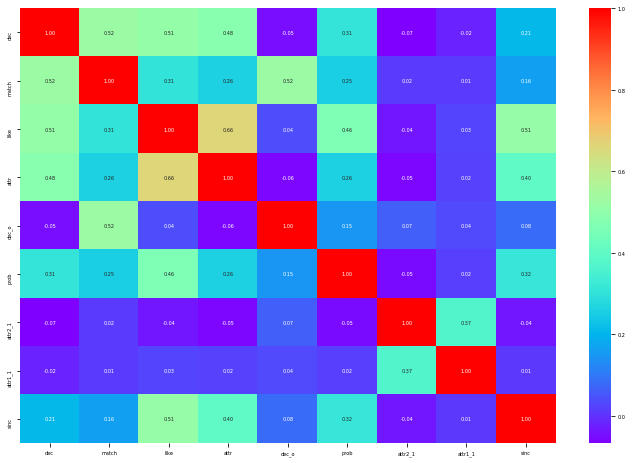

In [79]:
plt.figure(figsize=(12,8))
sns.heatmap(dataset_df.corr(),annot=True,fmt='.2f',cmap='rainbow', )
plt.show()

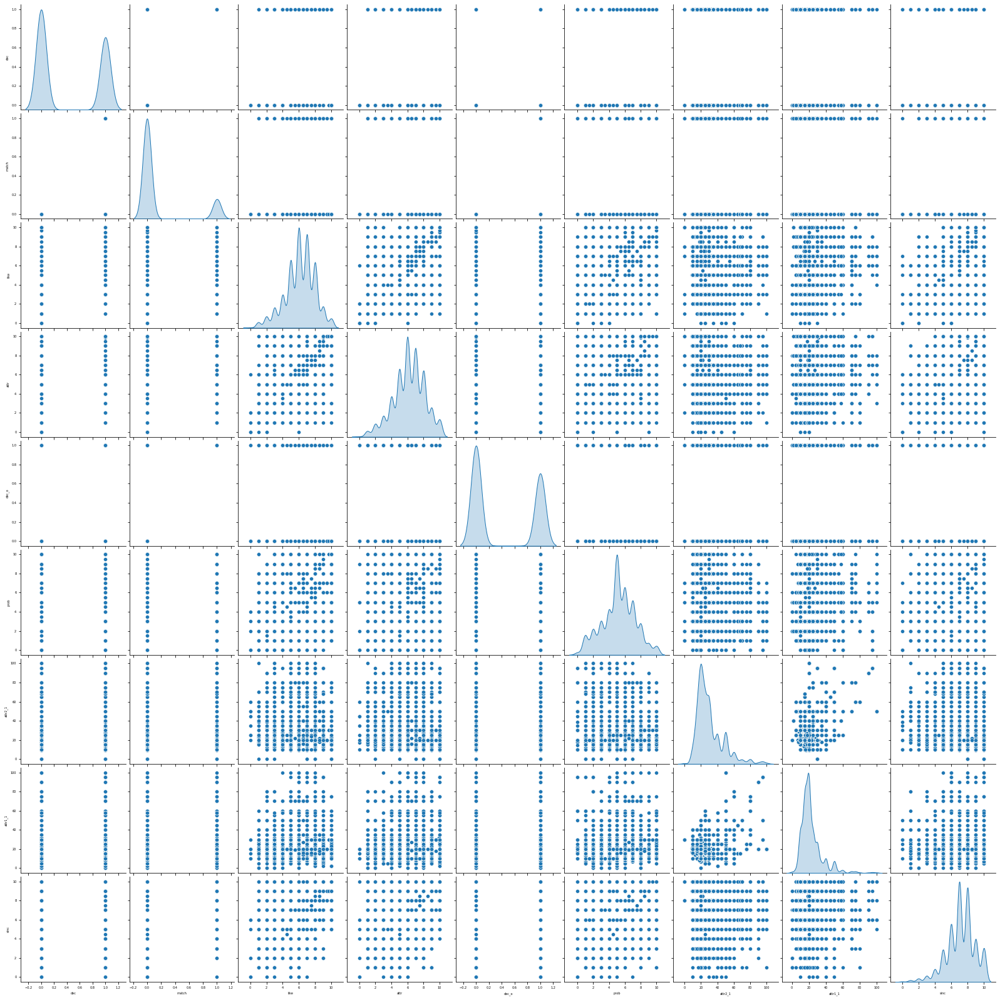

In [80]:
sns.pairplot(dataset_df,diag_kind='kde')

In [81]:
# Set features. This will also be used as your x values.

choose = 'dec'

X = dataset_df.drop(choose, axis=1)
y = dataset_df[choose]
print(X.shape, y.shape)

(8378, 8) (8378,)


In [82]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

n = 42

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=n)

In [83]:
from sklearn.preprocessing import LabelEncoder

# Scale your data
X_scaler = MinMaxScaler().fit(X_train)
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [84]:
# RANDOM FOREST

from sklearn.ensemble import RandomForestClassifier

# Create a random forest classifier
rf = RandomForestClassifier()
rf = rf.fit(X_train_scaled, y_train)
rf.score(X_test_scaled, y_test)

0.8563245823389022

In [85]:
# RANDOM FOREST

# We can sort the features by their importance - Random Forest

sorted(zip(rf.feature_importances_, X.columns), reverse=True)

[(0.26494268532185333, 'match'),
 (0.1473327371995237, 'attr'),
 (0.14567061666448278, 'like'),
 (0.11280866636445781, 'dec_o'),
 (0.10063304640764119, 'attr2_1'),
 (0.09427846486230043, 'attr1_1'),
 (0.0707084986382408, 'prob'),
 (0.06362528454149999, 'sinc')]

In [86]:
# RANDOM FOREST

predicted_class_rf = rf.predict(X_test_scaled)
print(predicted_class_rf)

[0 0 1 ... 0 0 0]


In [87]:
# RANDOM FOREST

# Calculate classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_class_rf,
                            target_names=["NO", "YES"]))

              precision    recall  f1-score   support

          NO       0.86      0.89      0.88      1187
         YES       0.85      0.81      0.83       908

    accuracy                           0.86      2095
   macro avg       0.86      0.85      0.85      2095
weighted avg       0.86      0.86      0.86      2095



# Hyperparameter Tuning

In [88]:
# RANDOM FOREST

# Create the GridSearch estimator along with a parameter object containing the values to adjust - Random Forest

from sklearn.model_selection import GridSearchCV

param_grid = {
            "n_estimators"      : [10,20,30],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8, 10],
            "bootstrap": [True, False]
        }

grid_rf = GridSearchCV(rf, param_grid, n_jobs =-1, cv=2)

In [89]:
# RANDOM FOREST

# Fit the model using the grid search estimator. - Random Forest
# This will take the SVC model and try each combination of parameters

grid_rf.fit(X_train_scaled, y_train)

GridSearchCV(cv=2, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=10, n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid='wa

In [90]:
# RANDOM FOREST

print(grid_rf.best_params_)
print(grid_rf.best_score_)

{'bootstrap': True, 'max_features': 'auto', 'min_samples_split': 8, 'n_estimators': 30}
0.8798344739773993


# Retrain the Forest Model upon GridSearchCv Result & GINI

### Graphing the tree 

### GINI Calculation

In [96]:
# Create a decision Tree classifier

n_estimators = 30
bootstrap = True
max_features = "auto" #auto default
min_samples_split = 8
# min_impurity_decrease = 0.5

model = RandomForestClassifier(n_estimators = n_estimators, bootstrap = bootstrap, min_samples_split = min_samples_split)
rf_retrained = model.fit(X_train_scaled, y_train)
print(f'test data: {rf.score(X_test_scaled, y_test)}')

test data: 0.8563245823389022


In [97]:
predicted_rf_retrained = rf_retrained .predict(X_test_scaled)
print(predicted_rf_retrained)

[0 0 1 ... 0 0 0]


### Model Score

In [98]:
# AFTER retrained

rf_retrained.score(X_test_scaled, y_test)

0.8649164677804296

In [99]:
# BEFORE retrained 

rf.score(X_test_scaled, y_test)

0.8563245823389022

### Classification Report 

In [101]:
# AFTER  retrained

# Calculate classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_rf_retrained,
                            target_names=["NO", "YES"]))

              precision    recall  f1-score   support

          NO       0.88      0.89      0.88      1187
         YES       0.85      0.84      0.84       908

    accuracy                           0.86      2095
   macro avg       0.86      0.86      0.86      2095
weighted avg       0.86      0.86      0.86      2095



In [102]:
# BEFORE  retrained

# Calculate classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_class_rf,
                            target_names=["NO", "YES"]))

              precision    recall  f1-score   support

          NO       0.86      0.89      0.88      1187
         YES       0.85      0.81      0.83       908

    accuracy                           0.86      2095
   macro avg       0.86      0.85      0.85      2095
weighted avg       0.86      0.86      0.86      2095



### Importance Ranking 

In [103]:
# AFTER  retrained

# We can sort the features by their importance - Random Forest

sorted(zip(rf_retrained.feature_importances_, X.columns), reverse=True)

[(0.26122607538292386, 'match'),
 (0.17385029750926803, 'attr'),
 (0.16111043446223397, 'like'),
 (0.12451596618886387, 'dec_o'),
 (0.08476974037863509, 'prob'),
 (0.07902884792874244, 'attr2_1'),
 (0.06887750660093825, 'attr1_1'),
 (0.04662113154839446, 'sinc')]

In [104]:
# BEFORE  retrained

# We can sort the features by their importance - Random Forest

sorted(zip(rf.feature_importances_, X.columns), reverse=True)

[(0.26494268532185333, 'match'),
 (0.1473327371995237, 'attr'),
 (0.14567061666448278, 'like'),
 (0.11280866636445781, 'dec_o'),
 (0.10063304640764119, 'attr2_1'),
 (0.09427846486230043, 'attr1_1'),
 (0.0707084986382408, 'prob'),
 (0.06362528454149999, 'sinc')]

# Model evaluation

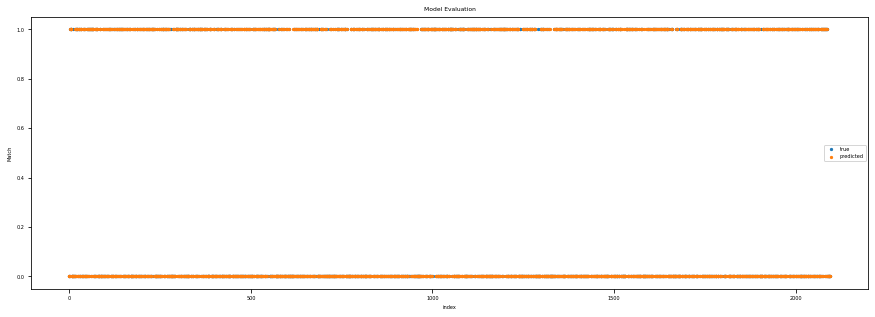

In [105]:
plt.figure(figsize = (15,5))
plt.title('Model Evaluation')
plt.scatter(range(0,len(X_test_scaled)), y_test, label = 'true', s=5)
plt.scatter(range(0,len(X_test_scaled)),  predicted_rf_retrained, label = 'predicted', s=5)
plt.xlabel('index')
plt.ylabel('Match')
plt.legend()
plt.show()

Text(0, 0.5, 'Difference in Match')

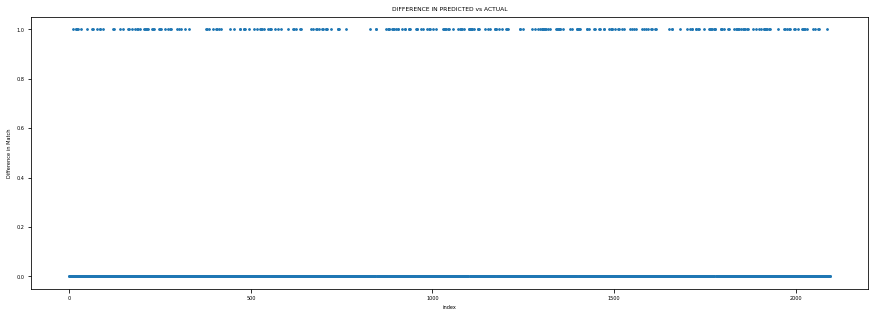

In [106]:
difference = abs( predicted_rf_retrained - y_test)
plt.figure(figsize = (15,5))
plt.title('DIFFERENCE IN PREDICTED vs ACTUAL')
plt.scatter(range(0,len(difference)), difference, s=3)
plt.xlabel('index')
plt.ylabel('Difference in Match')

# Graphing the model

In [107]:
!pip install dtreeviz             
!pip install dtreeviz[boost]      
!pip install dtreeviz[pyspark] 


In [108]:
features = list(dataset_df.columns[0:18])
features

['dec', 'match', 'like', 'attr', 'dec_o', 'prob', 'attr2_1', 'attr1_1', 'sinc']

In [109]:
# run when null values are fixed
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydot
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin/'

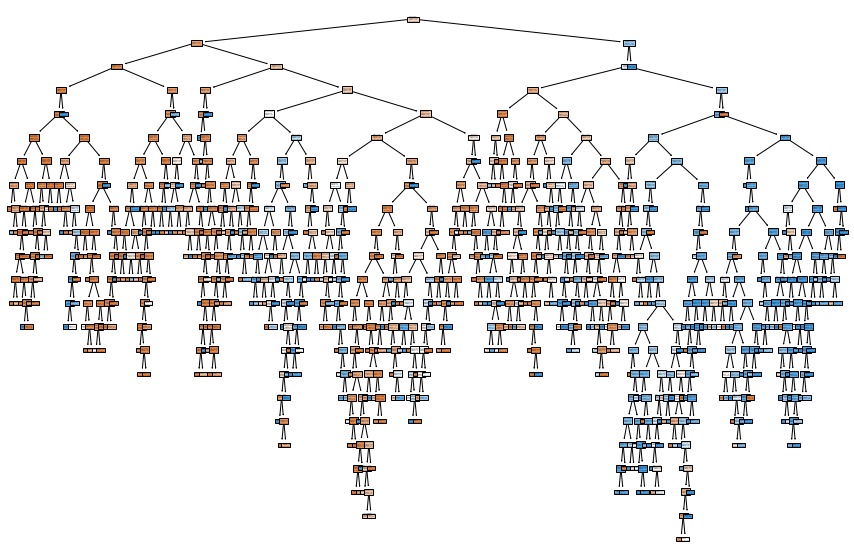

In [110]:
plt.rcParams.update({'figure.figsize': (15.0, 10.0)})
plt.rcParams.update({'font.size': 5})



_ = tree.plot_tree(rf_retrained.estimators_[0], feature_names=features, filled=True)

In [111]:
from dtreeviz.trees import dtreeviz

In [112]:
viz = dtreeviz(rf_retrained.estimators_[0], X_train_scaled, y_train, feature_names=features, target_name="Target")
viz

# Save Model

In [113]:
# DECISION TREE

# save your model by updating "your_name" with your name
# and "your_model" with your model variable
# be sure to turn this in to BCS
# if joblib fails to import, try running the command to install in terminal/git-bash
import joblib
RandomForest_model= 'giangcao8.sav'
joblib.dump(rf_retrained, RandomForest_model)

['giangcao8.sav']

In [114]:
loaded_model = joblib.load(RandomForest_model, mmap_mode=None)

In [115]:
from sklearn.neighbors import KNeighborsClassifier

k: 1, Train/Test Score: 0.989/0.840
k: 3, Train/Test Score: 0.927/0.844
k: 5, Train/Test Score: 0.903/0.853
k: 7, Train/Test Score: 0.896/0.855
k: 9, Train/Test Score: 0.893/0.852
k: 11, Train/Test Score: 0.891/0.856
k: 13, Train/Test Score: 0.888/0.858
k: 15, Train/Test Score: 0.887/0.861
k: 17, Train/Test Score: 0.887/0.860
k: 19, Train/Test Score: 0.884/0.861


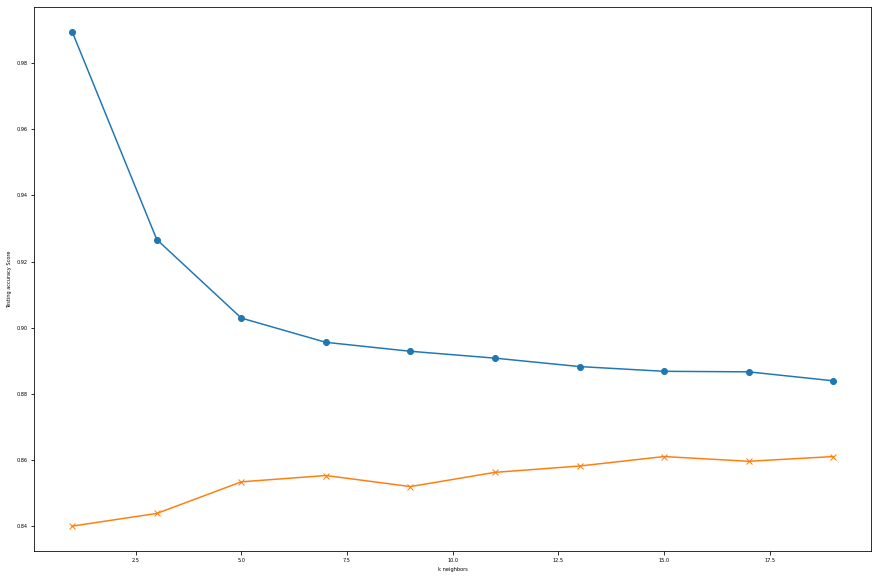

In [116]:
import matplotlib.pyplot as plt

# Loop through different k values to see which has the highest accuracy
# Note: We only use odd numbers because we don't want any ties
train_scores = []
test_scores = []
for k in range(1, 20, 2):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train_scaled, y_train)
    train_score = knn_model.score(X_train_scaled, y_train)
    test_score = knn_model.score(X_test_scaled, y_test)
    train_scores.append(train_score)
    test_scores.append(test_score)
    print(f"k: {k}, Train/Test Score: {train_score:.3f}/{test_score:.3f}")
    
    
plt.plot(range(1, 20, 2), train_scores, marker='o')
plt.plot(range(1, 20, 2), test_scores, marker="x")
plt.xlabel("k neighbors")
plt.ylabel("Testing accuracy Score")
plt.show()

### Choose the K = 11 

In [117]:
# Note that k: 11 provides the best accuracy where the classifier starts to stablize
knn_model = KNeighborsClassifier(n_neighbors=9)
knn_model.fit(X_train_scaled, y_train)
print('k=11 Test Acc: %.3f' % knn_model.score(X_test_scaled, y_test))

k=11 Test Acc: 0.852


### Quantify the KNN Model 

In [118]:
predicted_KNN = knn_model.predict(X_test_scaled)


In [119]:
# Calculate classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_KNN,
                            target_names=["NO", "YES"]))

              precision    recall  f1-score   support

          NO       0.87      0.87      0.87      1187
         YES       0.83      0.82      0.83       908

    accuracy                           0.85      2095
   macro avg       0.85      0.85      0.85      2095
weighted avg       0.85      0.85      0.85      2095



### GRAPHING

In [120]:
print(__doc__)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets

n_neighbors = 11

# import some data to play with


# we only take the first two features. We could avoid this ugly
# slicing by using a two-dim dataset
X = X
y = y

h = .02  # step size in the mesh

# Create color maps
cmap_light = ListedColormap(['orange', 'cyan', 'cornflowerblue'])
cmap_bold = ['darkorange', 'c', 'darkblue']

for weights in ['uniform', 'distance']:
    # we create an instance of Neighbours Classifier and fit the data.
    clf = neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
    clf.fit(X, y)

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure(figsize=(8, 6))
    plt.contourf(xx, yy, Z, cmap=cmap_light)

    # Plot also the training points
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=iris.target_names[y],
                    palette=cmap_bold, alpha=1.0, edgecolor="black")
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title("3-Class classification (k = %i, weights = '%s')"
              % (n_neighbors, weights))
    plt.xlabel(iris.feature_names[0])
    plt.ylabel(iris.feature_names[1])

plt.show()

Automatically created module for IPython interactive environment


TypeError: '(slice(None, None, None), 0)' is an invalid key

# Logistic Model

### Fit the Model 

In [121]:

from sklearn.linear_model import LogisticRegression
logistics_model = LogisticRegression()
logistics_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [122]:
logistics_model.fit(X_train_scaled, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

### Model Score 

In [123]:
print(f"Training Data Score: {logistics_model.score(X_train_scaled, y_train)}")
print(f"Testing Data Score: {logistics_model.score(X_test_scaled, y_test)}")

Training Data Score: 0.8709215342989018
Testing Data Score: 0.8529832935560859


### Tuning the Model by GridSearchCV 

In [124]:
# Create the GridSearch estimator along with a parameter object containing the values to adjust

param_grid = {'penalty': ['l1','l2'], 'C': [0.001,0.01,0.1,1,10,100,1000]}

grid_logic = GridSearchCV(logistics_model, param_grid, verbose=2)

In [125]:
# Fit the model using the grid search estimator. 
# This will take the SVC model and try each combination of parameters
grid_logic.fit(X_train_scaled, y_train)

Fitting 3 folds for each of 14 candidates, totalling 42 fits
[CV] C=0.001, penalty=l1 .............................................
[CV] .............................. C=0.001, penalty=l1, total=   0.0s
[CV] C=0.001, penalty=l1 .............................................
[CV] .............................. C=0.001, penalty=l1, total=   0.0s
[CV] C=0.001, penalty=l1 .............................................
[CV] .............................. C=0.001, penalty=l1, total=   0.0s
[CV] C=0.001, penalty=l2 .............................................
[CV] .............................. C=0.001, penalty=l2, total=   0.0s
[CV] C=0.001, penalty=l2 .............................................
[CV] .............................. C=0.001, penalty=l2, total=   0.0s
[CV] C=0.001, penalty=l2 .............................................
[CV] .............................. C=0.001, penalty=l2, total=   0.0s
[CV] C=0.01, penalty=l1 ..............................................
[CV] ...........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


[CV] .................................. C=1, penalty=l1, total=   0.0s
[CV] C=1, penalty=l1 .................................................
[CV] .................................. C=1, penalty=l1, total=   0.0s
[CV] C=1, penalty=l2 .................................................
[CV] .................................. C=1, penalty=l2, total=   0.0s
[CV] C=1, penalty=l2 .................................................
[CV] .................................. C=1, penalty=l2, total=   0.0s
[CV] C=1, penalty=l2 .................................................
[CV] .................................. C=1, penalty=l2, total=   0.0s
[CV] C=10, penalty=l1 ................................................
[CV] ................................. C=10, penalty=l1, total=   0.0s
[CV] C=10, penalty=l1 ................................................
[CV] ................................. C=10, penalty=l1, total=   0.0s
[CV] C=10, penalty=l1 ................................................
[CV] .

[Parallel(n_jobs=1)]: Done  42 out of  42 | elapsed:    0.6s finished


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='warn',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='warn',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=2)

In [126]:
print(grid_logic.best_params_)
print(grid_logic.best_score_)

{'C': 1, 'penalty': 'l1'}
0.8715581728473659


In [129]:
logistics_model_retrained = LogisticRegression(C = 1, penalty = 'l1')
logistics_model_retrained

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [130]:
logistics_model_retrained.fit(X_train_scaled, y_train)

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

### Score the model 

In [131]:
print(f"Training Data Score: {logistics_model_retrained.score(X_train_scaled, y_train)}")
print(f"Testing Data Score: {logistics_model_retrained.score(X_test_scaled, y_test)}")

Training Data Score: 0.8723539710329461
Testing Data Score: 0.8515513126491647


In [132]:
predictions_retrained = logistics_model_retrained.predict(X_test_scaled)


In [133]:
# Calculate classification report

from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_retrained,
                            target_names=["NO", "YES"]))

              precision    recall  f1-score   support

          NO       0.86      0.88      0.87      1187
         YES       0.84      0.81      0.83       908

    accuracy                           0.85      2095
   macro avg       0.85      0.85      0.85      2095
weighted avg       0.85      0.85      0.85      2095

